In [1]:
%%capture
!pip install wandb
!apt-get install poppler-utils
!pip install pdf2image
!pip install flashtorch
import requests
from pdf2image import convert_from_path
import matplotlib.pyplot as plt
import numpy as np
import torch
import requests
from torchvision import *
from torchvision.models import *
import wandb as wb
import random

In [2]:

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

def GPU(data):
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=device)

def GPU_data(data):
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=device)

def plot(x):
    fig, ax = plt.subplots()
    im = ax.imshow(x, cmap = 'gray')
    ax.axis('off')
    fig.set_size_inches(5, 5)
    plt.show()

def get_google_slide(url):
    url_head = "https://docs.google.com/presentation/d/"
    url_body = url.split('/')[5]
    page_id = url.split('.')[-1]
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id

def get_slides(url):
    url = get_google_slide(url)
    r = requests.get(url, allow_redirects=True)
    open('file.pdf', 'wb').write(r.content)
    images = convert_from_path('file.pdf', 500)
    return images

def load(image, size=224):
    means = [0.485, 0.456, 0.406]
    stds = [0.229, 0.224, 0.225]
    transform = transforms.Compose([
        transforms.Resize(size),
        transforms.CenterCrop(size),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ])
    tensor = transform(image).unsqueeze(0).to(device)
    tensor.requires_grad = True
    return tensor

In [3]:
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}

model = alexnet(weights='DEFAULT').to(device)
model.eval();

In [4]:
url = "https://docs.google.com/presentation/d/1B1Haahqh5MBBZjjTAZ36SaNoPWzI_aaLMzs11wI5utI/edit#slide=id.g206f8279a60_0_0"

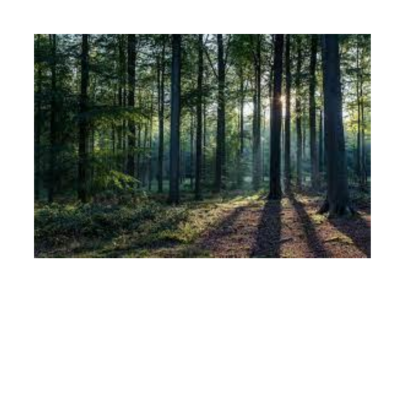

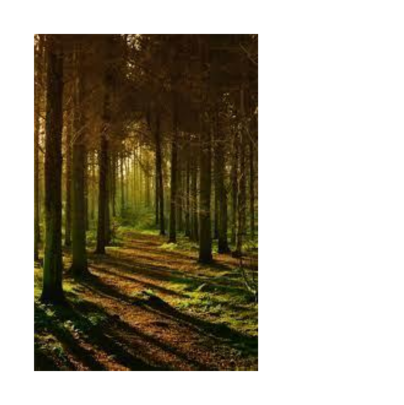

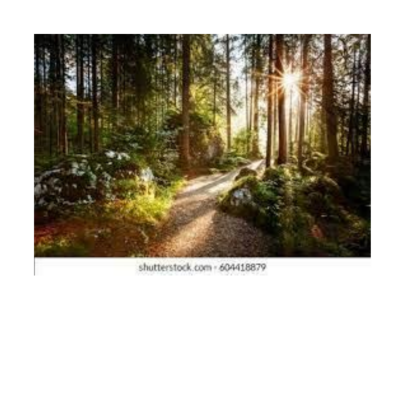

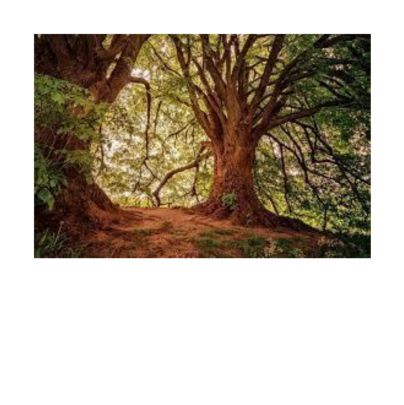

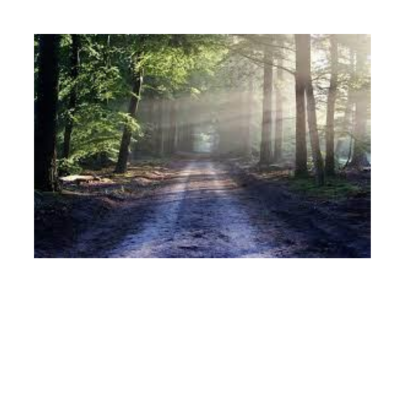

...

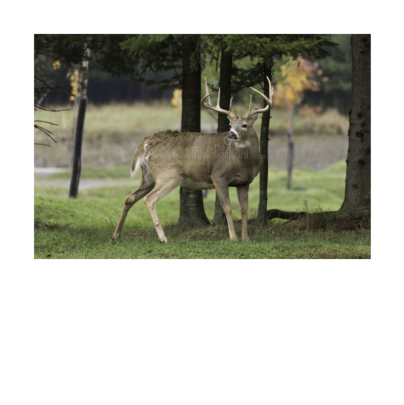

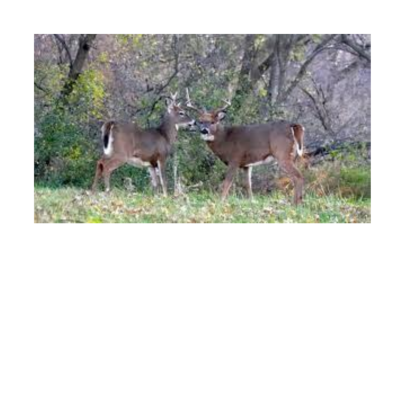

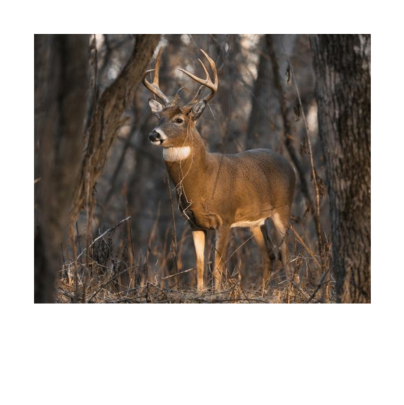

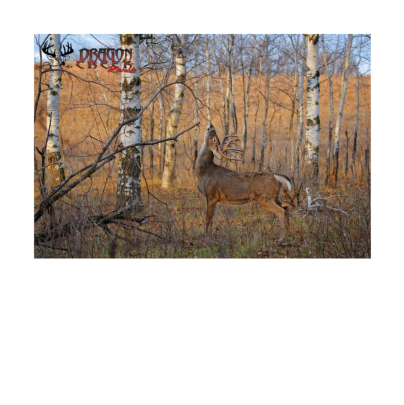

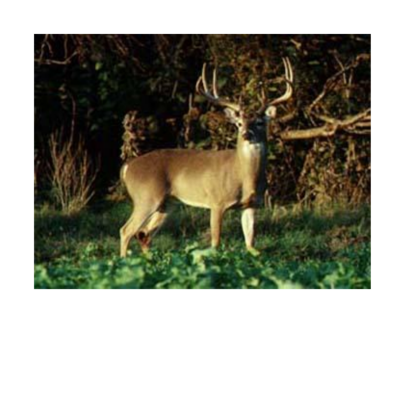

In [5]:
images = []

for image in get_slides(url):
    plot(image)
    images.append(load(image))
images = torch.vstack(images)


In [6]:
images.shape

torch.Size([50, 3, 224, 224])

In [7]:
model(images)

tensor([[ 0.3565, -2.9814, -2.2951,  ..., -0.4306,  0.3707,  0.5748],
        [-2.0748, -2.2016, -3.8082,  ...,  0.2011,  1.7199,  0.5819],
        [ 2.1427, -2.2884, -4.5626,  ...,  0.2620,  2.1874, -2.3334],
        ...,
        [-3.4123, -2.6872, -3.9749,  ..., -0.0487,  1.5519, -0.8616],
        [-4.6103, -3.0360, -5.3547,  ..., -0.9335,  1.6809, -1.0048],
        [ 2.0178, -1.9566, -0.5283,  ...,  0.7148,  1.9667, -0.9935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

In [8]:
y = model(images)

In [9]:
y.shape

torch.Size([50, 1000])

In [10]:
guesses = torch.argmax(y, 1).cpu().numpy()

In [11]:
for i in list(guesses):
    print(labels[i])

chime, bell, gong
prayer rug, prayer mat
lakeside, lakeshore
wallet, billfold, notecase, pocketbook
window shade
lakeside, lakeshore
Indian elephant, Elephas maximus
broom
swing
table lamp
shoji
lakeside, lakeshore
monitor
viaduct
lakeside, lakeshore
monitor
Sealyham terrier, Sealyham
monitor
lakeside, lakeshore
cucumber, cuke
lakeside, lakeshore
lakeside, lakeshore
maze, labyrinth
lakeside, lakeshore
coyote, prairie wolf, brush wolf, Canis latrans
red fox, Vulpes vulpes
malinois
hare
coyote, prairie wolf, brush wolf, Canis latrans
Egyptian cat
book jacket, dust cover, dust jacket, dust wrapper
bighorn, bighorn sheep, cimarron, Rocky Mountain bighorn, Rocky Mountain sheep, Ovis canadensis
bighorn, bighorn sheep, cimarron, Rocky Mountain bighorn, Rocky Mountain sheep, Ovis canadensis
cougar, puma, catamount, mountain lion, painter, panther, Felis concolor
coyote, prairie wolf, brush wolf, Canis latrans
coyote, prairie wolf, brush wolf, Canis latrans
bighorn, bighorn sheep, cimarron, Roc

In [12]:
Y = np.zeros(50,)
Y[25:] = 1

In [13]:
Y

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [14]:
X = y.detach().cpu().numpy()

In [15]:
X.shape

(50, 1000)

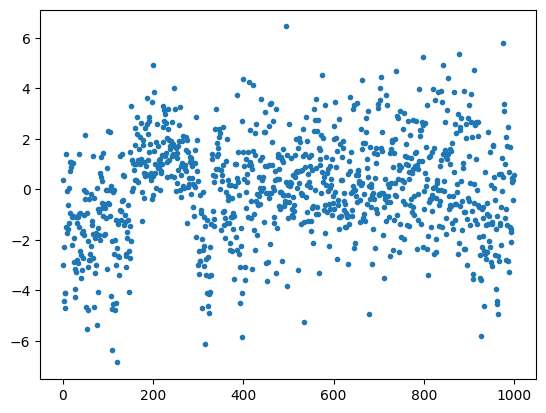

In [16]:
plt.plot(X[0],'.')

(array([  6.,  22.,  54., 114., 242., 272., 183.,  83.,  20.,   4.]),
 array([-6.85998344, -5.52962732, -4.1992712 , -2.86891508, -1.53855896,
        -0.20820284,  1.12215328,  2.4525094 ,  3.78286552,  5.11322165,
         6.44357777]),
 <BarContainer object of 10 artists>)

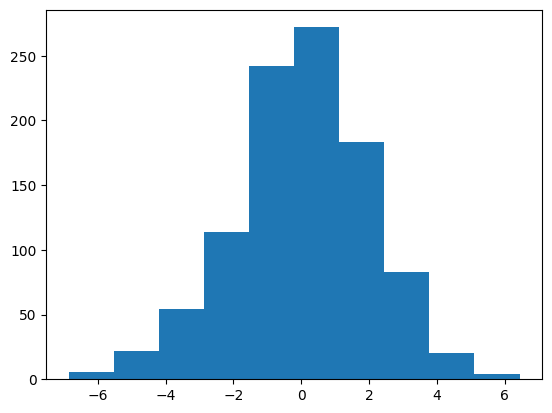

In [17]:
plt.hist(X[0])

In [18]:
X = GPU_data(X)
Y = GPU_data(Y)

In [19]:
def softmax(x):
    s1 = torch.exp(x - torch.max(x,1)[0][:,None])
    s = s1 / s1.sum(1)[:,None]
    return s

In [20]:
def cross_entropy(outputs, labels):
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0]

In [21]:
def randn_trunc(s): #Truncated Normal Random Numbers
    mu = 0
    sigma = 0.1
    R = stats.truncnorm((-2*sigma - mu) / sigma, (2*sigma - mu) / sigma, loc=mu, scale=sigma)
    return R.rvs(s)

In [22]:
def Truncated_Normal(size):

    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2)
    u2 = torch.rand(size)
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2)

    return z

In [23]:
def acc(out,y):
    with torch.no_grad():
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0]

In [24]:
X.shape

torch.Size([50, 1000])

In [25]:
def get_batch(mode):
    b = c.b
    if mode == "train":
        r = np.random.randint(X.shape[0]-b)
        x = X[r:r+b,:]
        y = Y[r:r+b]
    elif mode == "test":
        r = np.random.randint(X_test.shape[0]-b)
        x = X_test[r:r+b,:]
        y = Y_test[r:r+b]
    return x,y

In [26]:
def model(x,w):

    return x@w[0]

In [27]:
def make_plots():

    acc_train = acc(model(x,w),y)

    # xt,yt = get_batch('test')

    # acc_test = acc(model(xt,w),yt)

    wb.log({"acc_train": acc_train})

In [ ]:
# wandb.init(
#         project="Linear_Model_Photo_1",
#         config={
#             "epochs": 100000,
#             "batch_size": 32,
#             "lr": 0.001,
#             "dropout": random.uniform(0.01, 0.80),
#             })
wb.init(project="Linear_Model_Photo_1");
c = wb.config

c.h = 0.001
c.b = 32
c.epochs = 100000

w = [GPU(Truncated_Normal((1000,2)))]

optimizer = torch.optim.Adam(w, lr=c.h)

for i in range(c.epochs):

    x,y = get_batch('train')

    loss = cross_entropy(softmax(model(x,w)),y)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    wb.log({"loss": loss})

    make_plots()


wandb: Currently logged in as: stoic-sophist. Use `wandb login --relogin` to force relogin


<ipython-input-2-9358ae2626b0>:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(data, requires_grad=True, dtype=torch.float, device=device)
